In [3]:
import numpy as np
import matplotlib.pyplot as plt
import pickle
from functions import *
import glob

/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/least_angle.py:30: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  method='lar', copy_X=True, eps=np.finfo(np.float).eps,
/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/least_angle.py:167: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  method='lar', copy_X=True,

## Let's sort out the reduction of the IGRINS data!

In [35]:
# load skycalc telluric models - one per time stamp
skycalc_dir = 'Input_data/igrins/skycalc_models/'
file_list = sorted(glob.glob(skycalc_dir+'skycalc_models_AU_MIC_Gemini_South_frame*.npz'))
print('{} files found'.format(len(file_list)))

skycalc_models = [] # will be in order: nep, ndet, npix 
skycalc_wlens = [] # same as models
for ifile in range(len(file_list)):
    d = np.load(file_list[ifile],allow_pickle=True)
    skycalc_models.append(d['flux'])
    skycalc_wlens.append(d['wlens'])
    

125 files found


In [36]:
# and the data
data_dir = 'Input_data/igrins/'

filename = data_dir + 'data_igrins.pkl'

# open file

print("Read data from",filename)

with open(filename,'rb') as specfile:
    A = pickle.load(specfile)
orders,WW,Ir,blaze,Ia,T_obs,phase,window,berv,vstar,airmass,SN = A

Read data from Input_data/igrins/data_igrins.pkl


In [194]:
# read_data.py is normalising the spectra by max value, but not working so well for order 21
# edge pixels are affecting
# might be better to fit the blaze to the unnormalised spectra
dir_data = 'Data/IGRINS/'
time_JD, wlens, data_RAW, data_var, data_sn, airms, humidity = read_igrins_data(dir_data)

number of files: 0


FileNotFoundError: [Errno 2] No such file or directory: 'Data/IGRINS/SDCH_20210803_0276.wave.fits'

In [37]:
### Create order objects
nord     = len(orders)
print(nord,"orders detected")
list_ord = []
wlens = []
wlens_mean = []
for nn in range(nord):
    O        = Order(orders[nn])
    O.W_raw  = np.array(WW[nn],dtype=float)
    O.I_raw  = np.array(Ir[nn],dtype=float)
    O.SNR    = np.array(SN[nn],dtype=float)
    O.W_mean = O.W_raw.mean()
    list_ord.append(O)
    wlens.append(np.array(WW[nn]))
    wlens_mean.append(O.W_mean)
print("DONE\n")
nep = len(phase)

54 orders detected
DONE



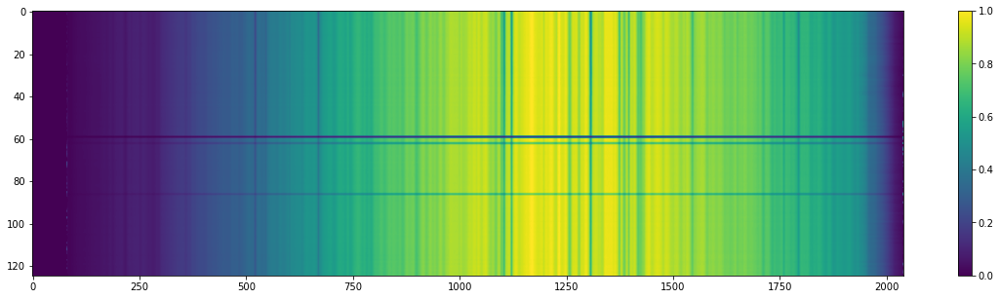

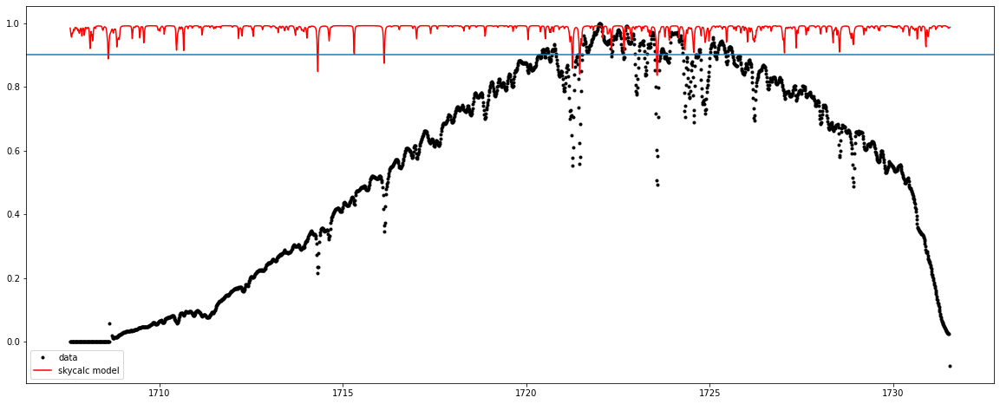

In [190]:
iord = 21
O = list_ord[iord] # let's work with one order for now
atm = []
watm = []
for iep in range(nep):
    atm.append(skycalc_models[iep][iord])
    watm.append(skycalc_wlens[iep][iord])
O.I_atm = np.array(atm)
O.W_atm = np.array(watm)
plt.figure(figsize=(20,5))
plt.imshow(O.I_raw,aspect='auto',vmin=0,vmax=1)
plt.colorbar()
plt.show()
plt.figure(figsize=(20,8))

plt.plot(O.W_raw,O.I_raw[20],'.k',label='data')
plt.plot(O.W_atm[0],np.median(O.I_atm,axis=0),'r-',label='skycalc model')
plt.axhline(0.9)
plt.legend()
plt.show()

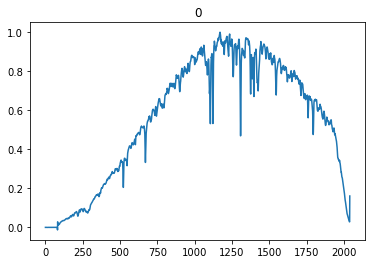

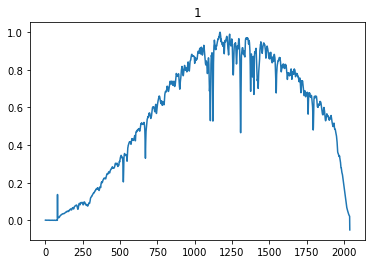

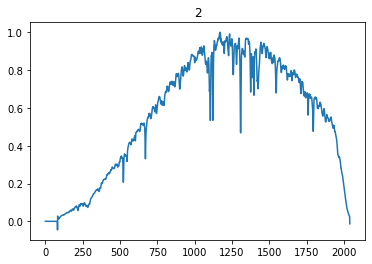

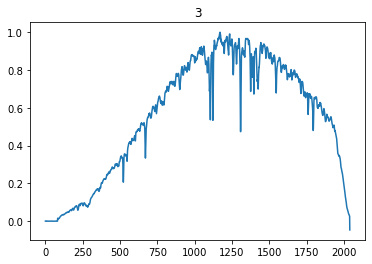

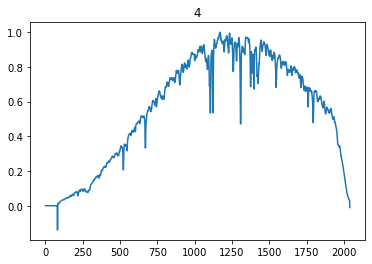

...

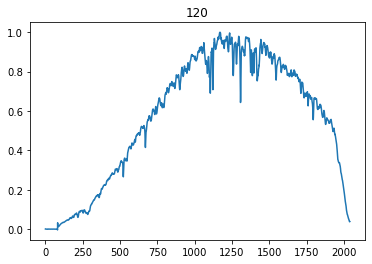

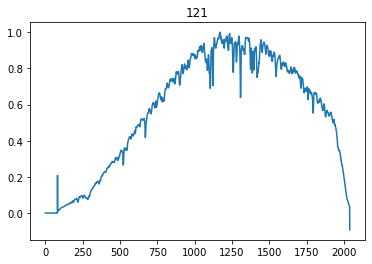

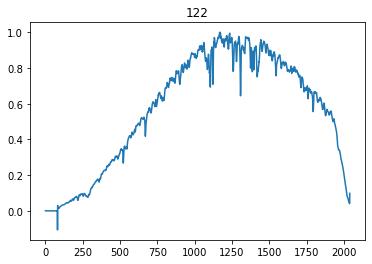

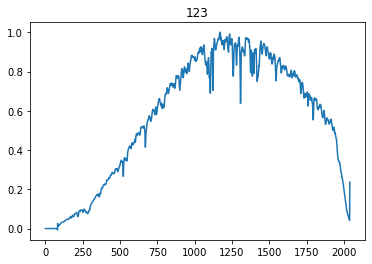

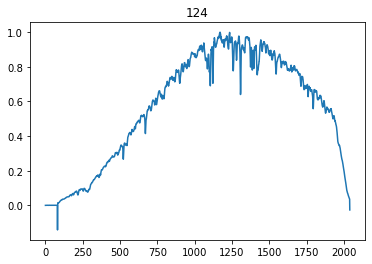

In [193]:
for iep in range(nep):
    plt.plot(O.I_raw[iep])
    plt.title(iep)
    plt.show()

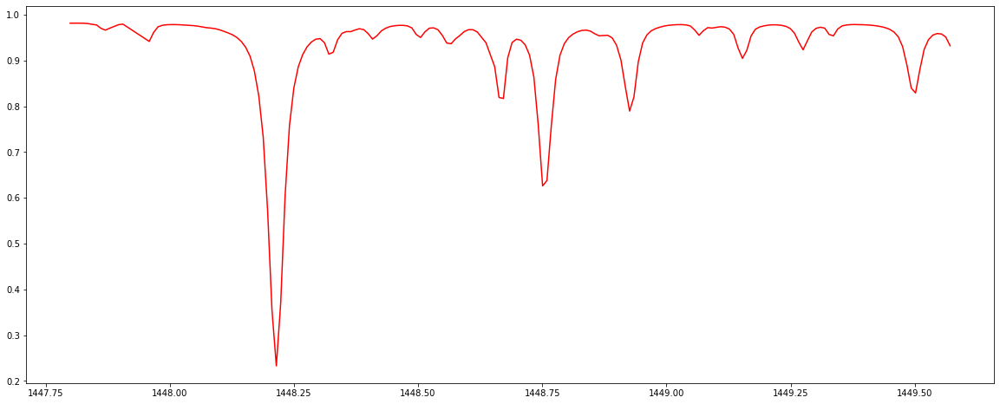

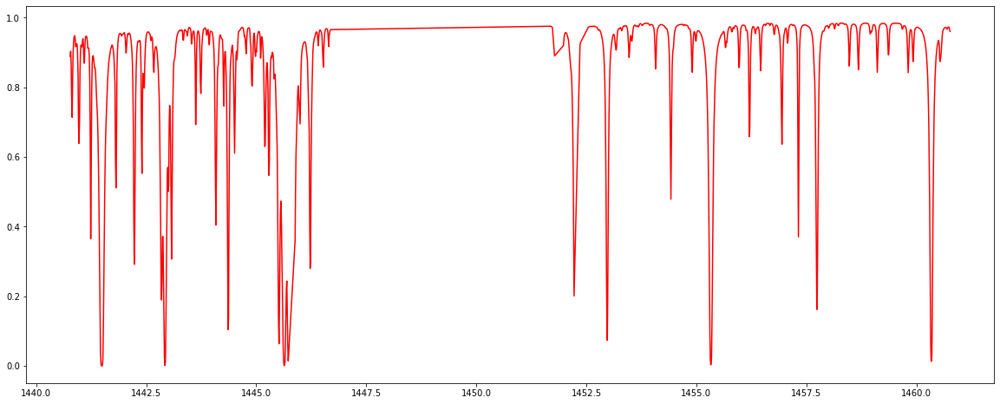

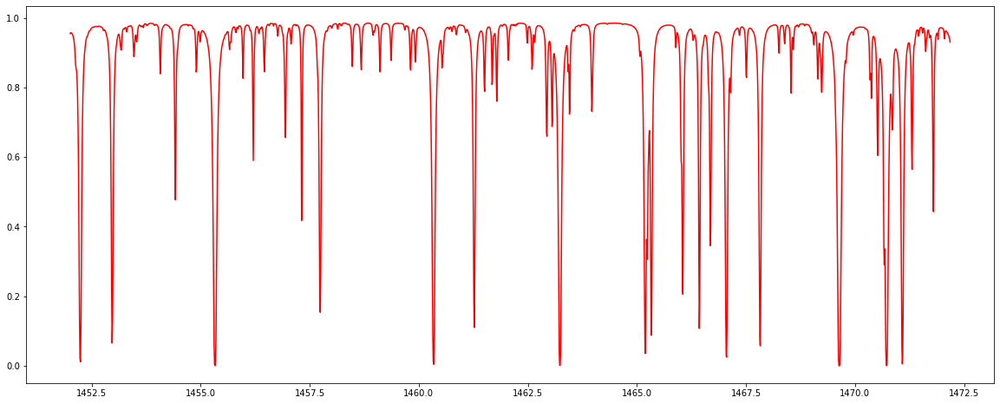

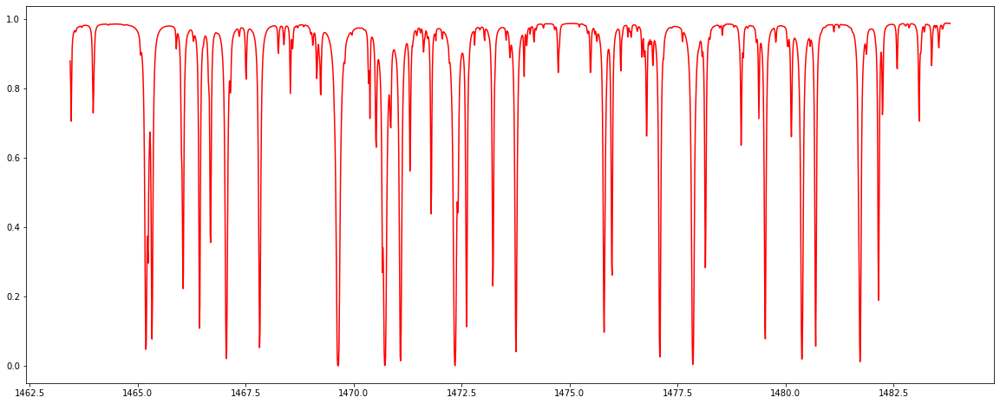

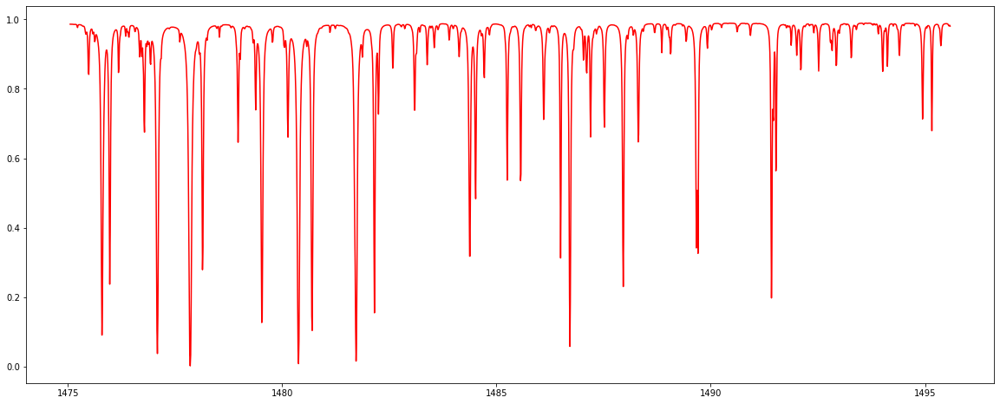

...

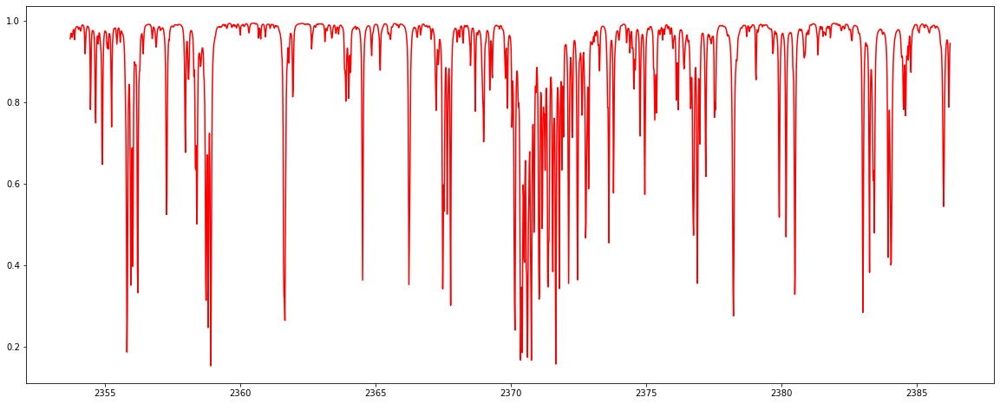

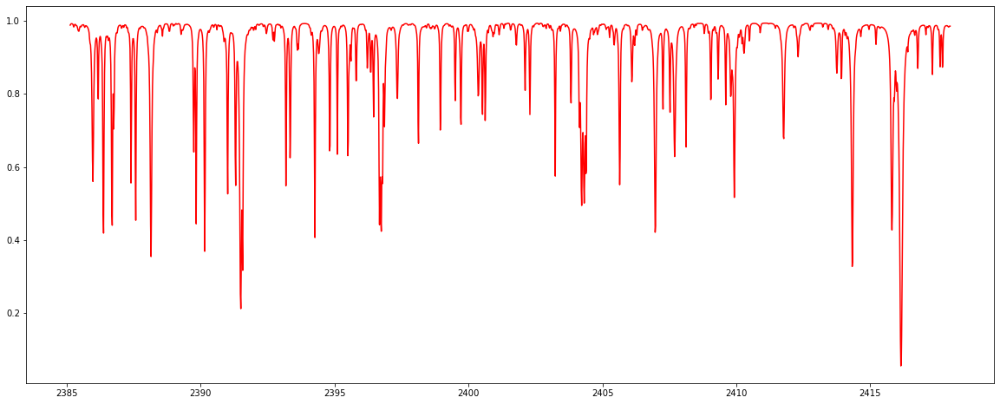

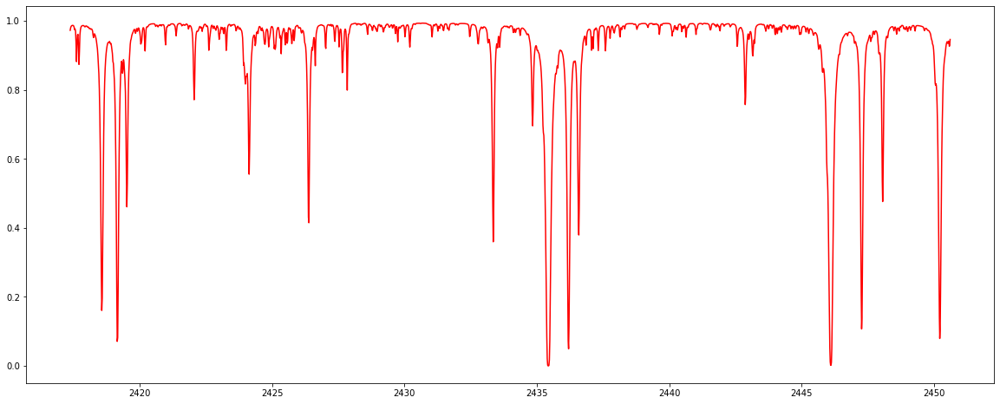

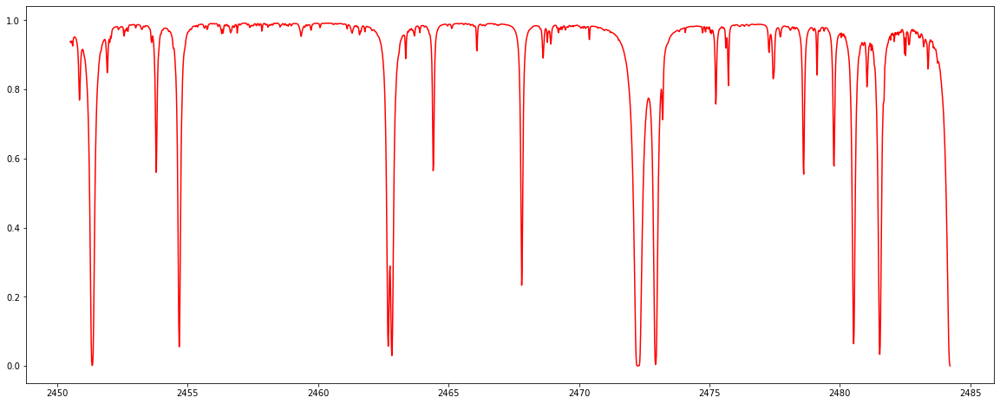

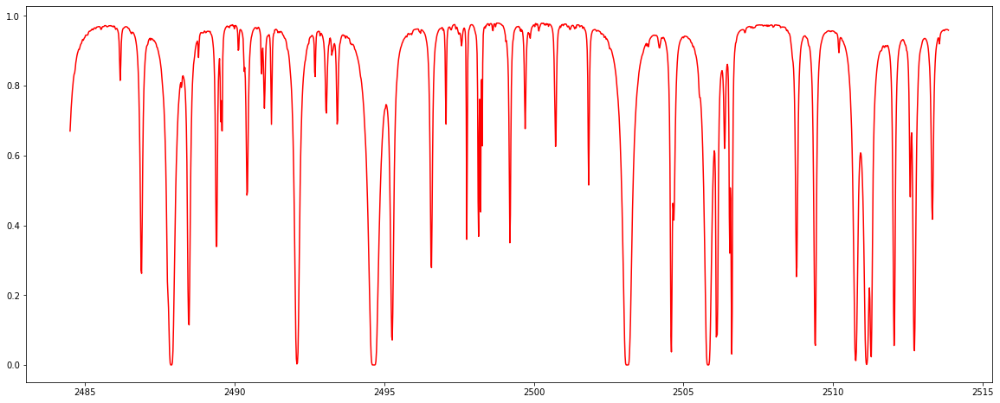

In [189]:
for nn in range(nord):
    O = list_ord[nn]
    atm = []
    watm = []
    for iep in range(nep):
        atm.append(skycalc_models[iep][nn])
        watm.append(skycalc_wlens[iep][nn])
    O.I_atm = np.array(atm)
    O.W_atm = np.array(watm)
    plt.figure(figsize=(20,8))
    plt.plot(O.W_atm[0],np.median(O.I_atm,axis=0),'r-',label='skycalc model')
    plt.show()

In [ ]:
for nn in range(nord):
    O       = list_ord[nn]
    atm = []
    for iep in range(nep):
        atm.append(skycalc_models[iep][nn])
    O.I_atm = np.array(atm)
    plt.plot(np.median(O.I_atm,axis=0))
    plt.show()
    O.W_cl, O.I_cl = O.remove_tellurics(0.6,0.1)

In [ ]:
for nn in range(nord):
    O = list_ord[nn]
    plt.figure(figsize=(20,5))
    
    plt.imshow(O.I_raw,aspect='auto')
    plt.colorbar()
    plt.show()
    plt.figure(figsize=(20,5))
    plt.imshow(O.I_cl,aspect='auto')
    plt.colorbar()
    plt.show()

###  Try fitting a blaze function first
1. Use remove_tellurics() to identify low flux regions
2. Additional mask below 0.2 in the original flux
3. Fit a blaze function to the masked spectra

In [78]:
def _remove_tellurics(I_atm,dep_min,thres_up):

        """
        --> Inputs:     - Order object
                        - dep_min: Threshold (in relative absorption unit) above
                                   which lines are removed
                        - thres_up: When removing a region of strong absorption,
                                    all points are remove until reaching a relative
                                    absorption of 'thres_up'

        --> Outputs:    - self.I_cl; self.W_cl
        """

        ### Identify regions of strong telluric absorption from the median DRS-provided
        ### telluric spectrum
        Am      = np.median(I_atm,axis=0)
        plt.plot(Am)
        plt.show()
        ind_A   = np.where(Am<1-dep_min)[0]
        #print(ind_A)

        ### Identify regions adjacent to the telluric absorption lines spotted in the previous step
        ind_tel = []
        for ii in range(len(ind_A)):
            i0     = ind_A[ii]
            n_ini2 = 0
            while Am[i0-n_ini2] < 1 - thres_up:
                if i0 - n_ini2 == 0: break
                n_ini2 += 1
            n_end2 = 0
            while Am[i0+n_end2] < 1 - thres_up:
                if i0 + n_end2 == len(Am)-1: break
                n_end2 += 1
            itel = np.arange(i0-n_ini2,i0+n_end2+1)
            ind_tel.append(itel)
        if len(ind_tel)>0: ind_tel = np.sort(np.unique(np.concatenate(ind_tel)))
        else:              ind_tel = []
        
        
        ### Remove regions of strong telluric absorption
        #I_cl    = np.delete(self.I_raw,ind_tel,axis=1)
        #W_cl    = np.delete(self.W_raw,ind_tel)
        return ind_tel

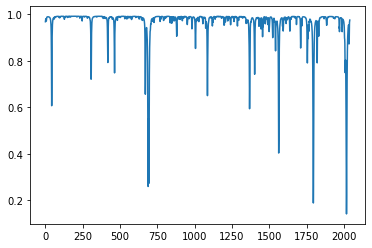

In [79]:
ind_tel = _remove_tellurics(O.I_atm,0.6,0.03)

In [113]:
Ir = np.copy(O.I_raw)
WW = np.copy(O.W_raw)
Ir[:,ind_tel] = np.nan
WW[ind_tel]   = np.nan

Ir_mean = np.mean(Ir,axis=0)
ind_low = np.where(Ir_mean<=0.15)[0]
Ir[:,ind_low] = np.nan
WW[ind_low] = np.nan

nep,npix = Ir.shape
ind   = []
for iep in range(nep):
    i = np.where(np.isfinite(Ir[iep])==True)[0]
    ind.append(i)
r     = np.array(list(set.intersection(*map(set,ind))),dtype=int)
r     = np.sort(np.unique(r))
Ir    = Ir[:,r]
WW    = WW[r]
nep,npix = Ir.shape

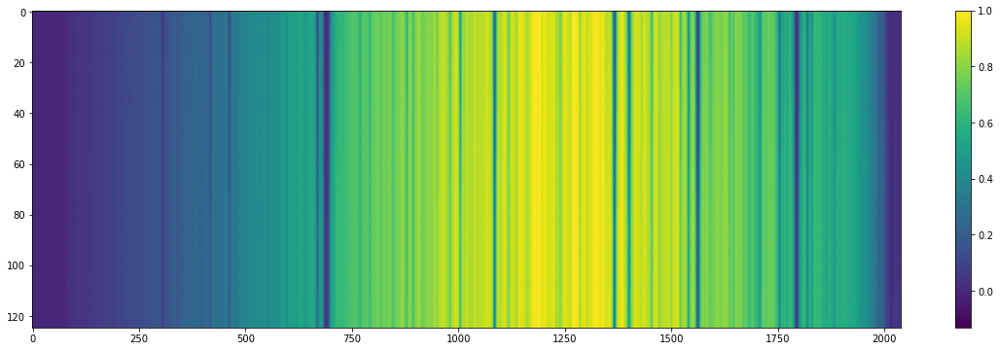

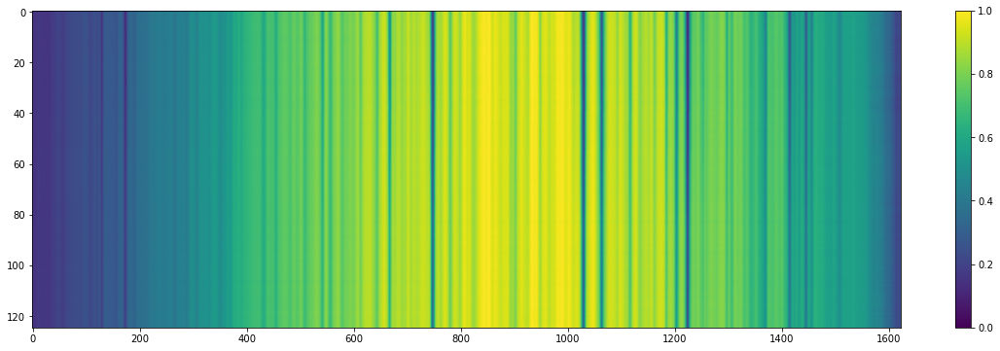

In [114]:
plt.figure(figsize=(20,6))
plt.imshow(O.I_raw,aspect='auto')
plt.colorbar()
plt.figure(figsize=(20,6))
plt.imshow(Ir,aspect='auto',vmin=0,vmax=1)
plt.colorbar()

In [115]:
def blazeFit(wav, normspec, maxrms, numcalls=10, curcall=0,
             verbose=False, showplot=False):
    """PURPOSE: To fit the continuum of an order of an
    echelle spectrum to model the Blaze Function.
    INPUTS:
    WAV: The wavelength
    SPEC: The spectrum. This should be the same number of elements
    (and corrsepond to) the input wavelength array (wav).
    MAXRMS: The threshold criteria for the fit in normalized rms.
    For example, a threshold of 0.01 will keep iterating until
    the rms of the residuals of dividing the continuum pixels
    by the Blaze Function comes out to 1%.
    NUMCALLS: The maximum number of recursive iterations to execute.
    CURCALL: Store the current iteration for recursive purposes.
    VERBOSE: Set this to True to print out the iteration, residual
    rms and the threshold value.
    SHOWPLOT: Set this to True to produce a plot of the spectrum,
    threshold and continuum at every iteration.
    """
    #get wavelength range:
    wavspread = max(wav) - min(wav)

    #center wavelength range about zero:
    wavcent = wav - min(wav) - wavspread/2.

    #normalize the spectrum:
    #normspec = spec/max(spec)

    #fit a polynomial to the data:
    z = np.polyfit(wav, normspec, 7)

    #make a function based on those polynomial coefficients:
    cfit = np.poly1d(z)

    #make a lower threshold that is offset below the continuum fit. All points
    #below this fit (i.e. spectral lines) will be excluded from the fit in the
    #next iteration.
    thresh = cfit(wav) - (0.5 * (1. / (curcall + 1)))
    mask = np.where(normspec > thresh)[0]
    #print(mask)
    a = np.ones(len(normspec),'bool')
    a[mask] = 0
    if (showplot is True):
        #plot the original spectrum:
        plt.plot(wav, normspec)
        #overplot the continuum fit
        plt.plot(wav, cfit(wav))
        plt.plot(wav, thresh)
        plt.plot(wav[a], normspec[a], 'r.')
        plt.show()

    mask = np.invert(a)

    residrms = np.std(normspec/cfit(wav))
    if (verbose is True):
        print('now in iteration {0}'.format(curcall))
        print('residrms is now {0:.5f}'.format(residrms))
        print('maxrms is {0})'.format(maxrms))
        #print('z is: {}'.format(z))

    #now un-center the wavelength range:
    #if curcall == 0:
        #z[-1] = z[-1] - min(wav) - wavspread/2.

    wav = wav[mask]
    normspec = normspec[mask]
    return z,mask,residrms,wav,normspec

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

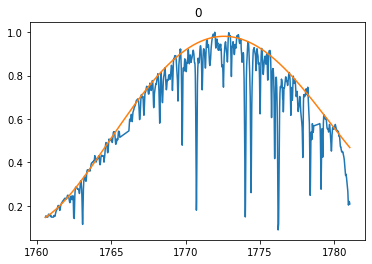

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

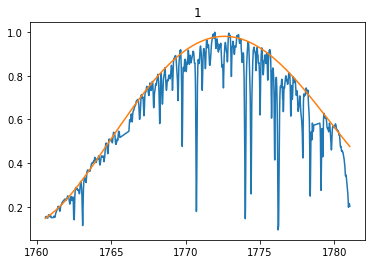

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

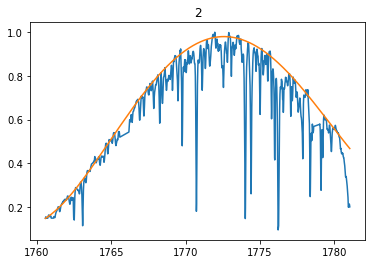

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

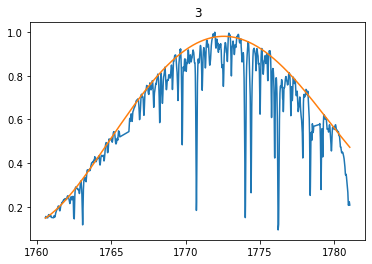

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

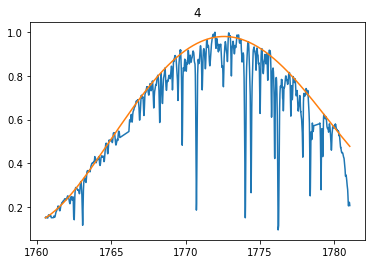

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

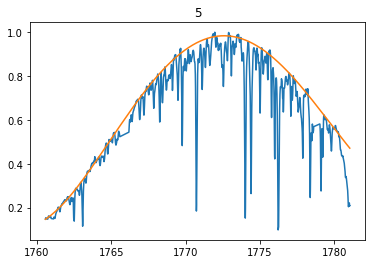

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

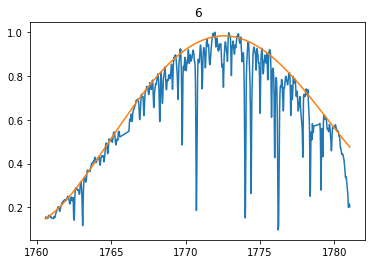

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

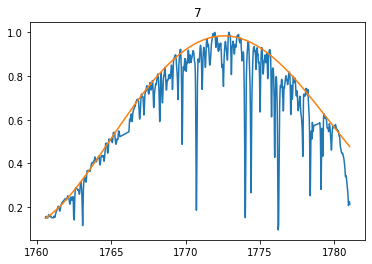

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

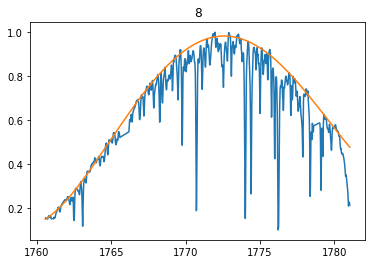

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

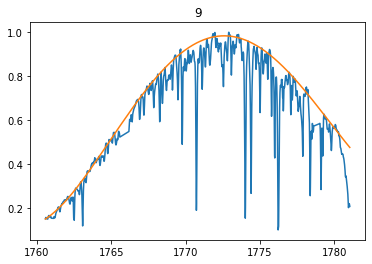

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

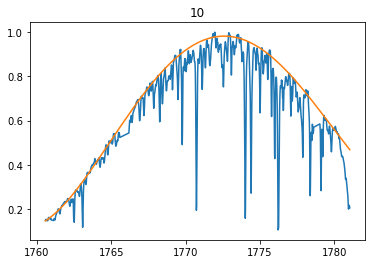

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

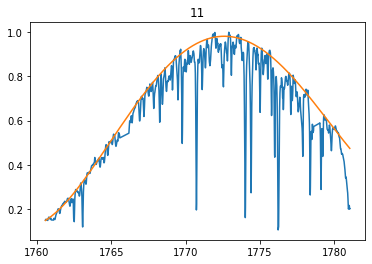

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

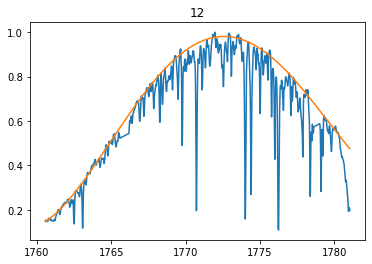

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

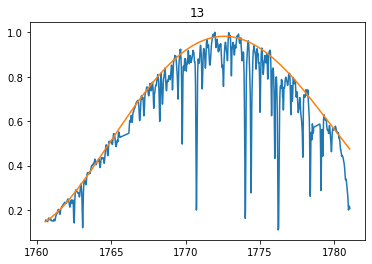

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

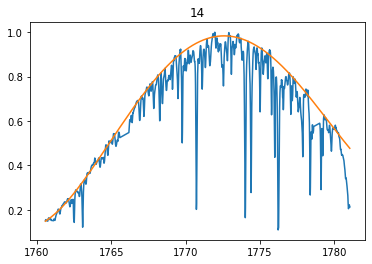

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

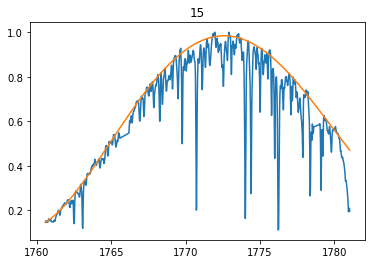

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

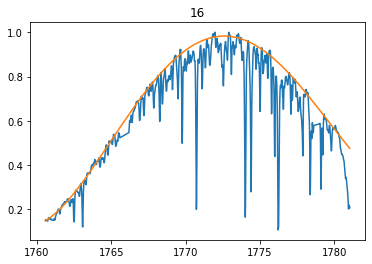

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

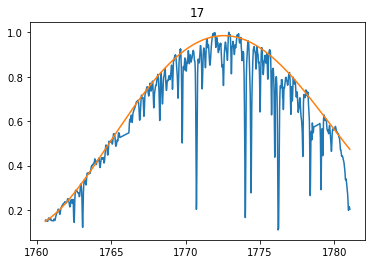

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

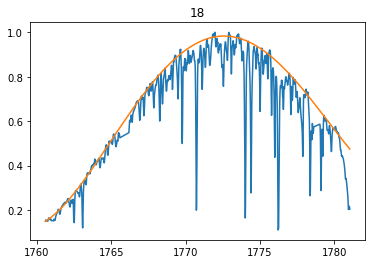

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

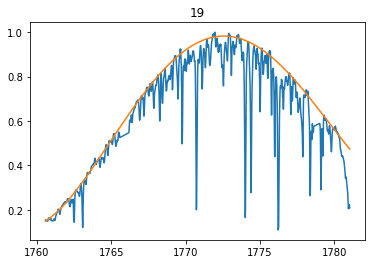

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

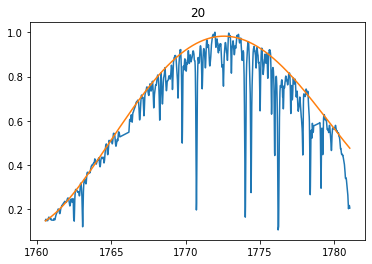

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

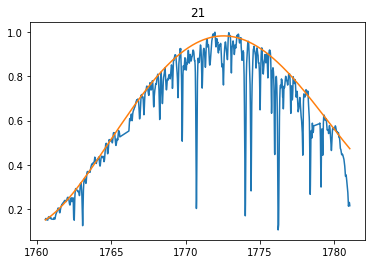

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

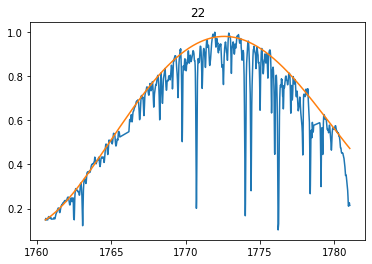

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

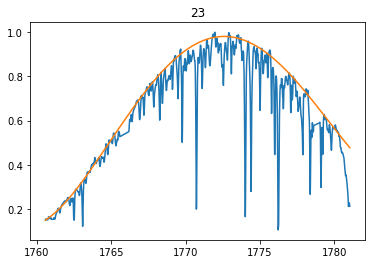

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

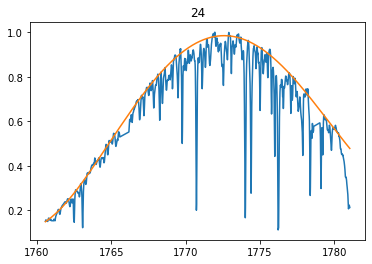

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

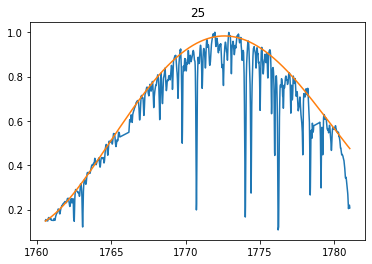

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

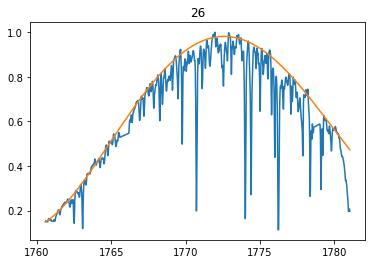

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

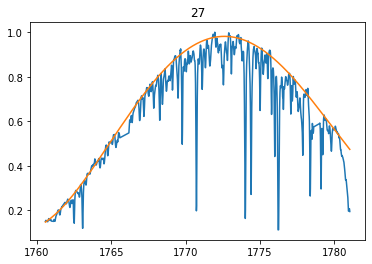

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

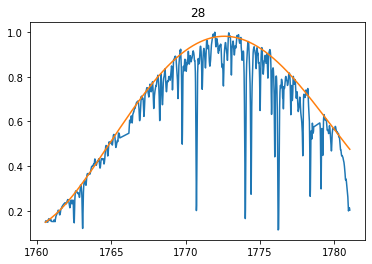

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

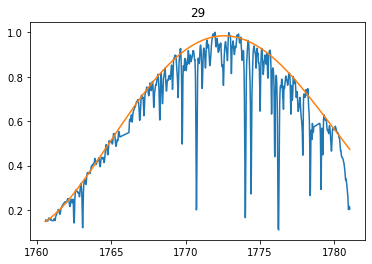

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

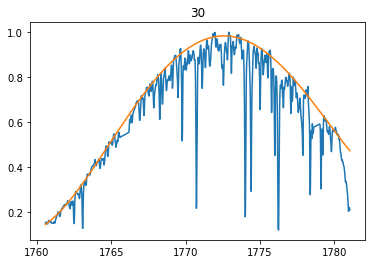

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

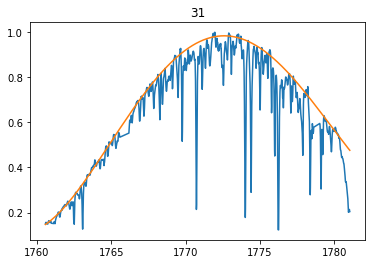

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

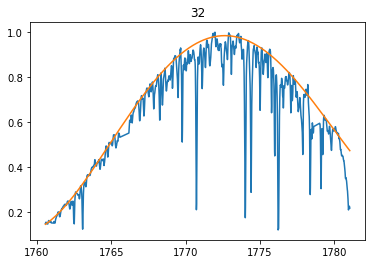

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

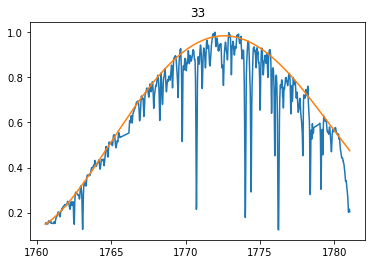

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

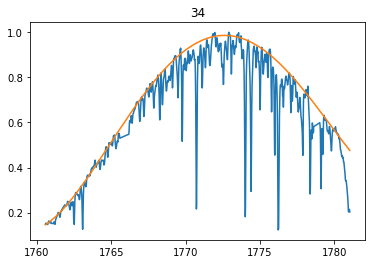

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

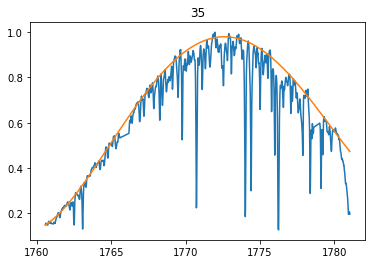

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

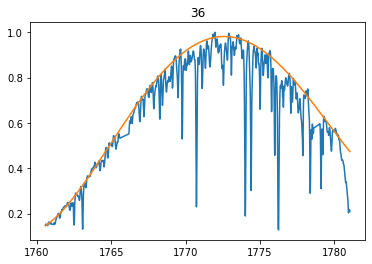

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

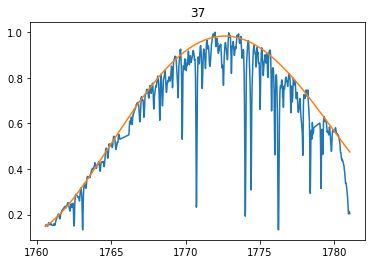

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

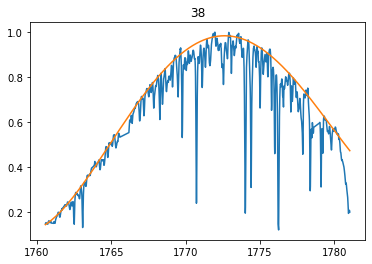

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

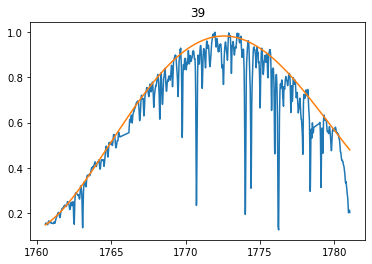

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

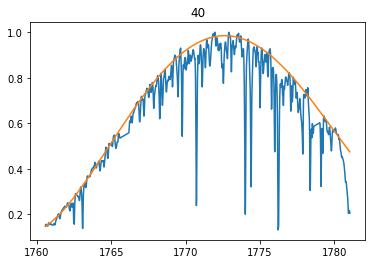

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

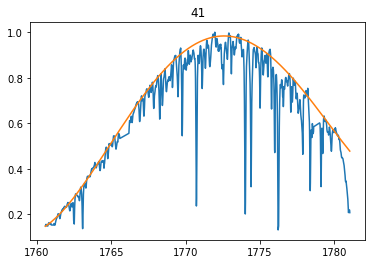

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

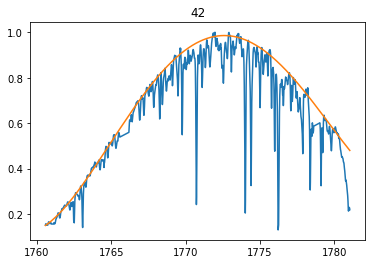

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

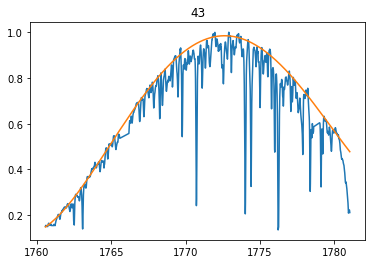

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

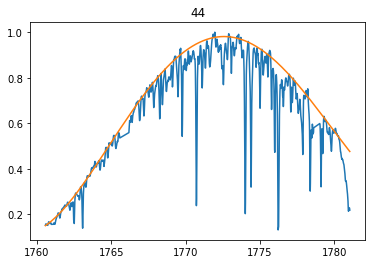

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

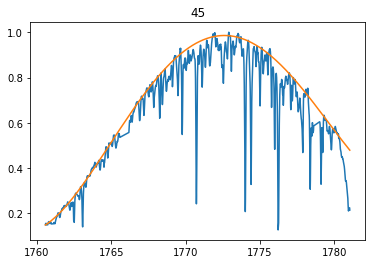

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

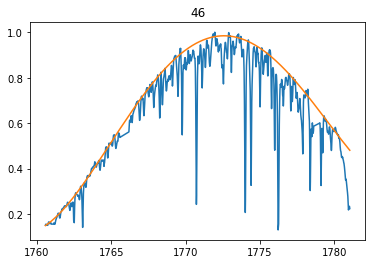

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

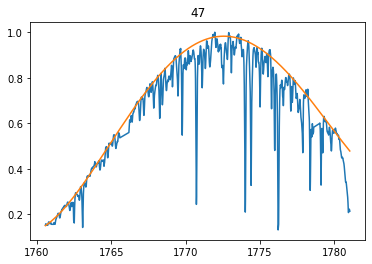

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

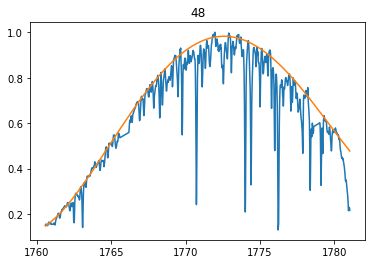

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

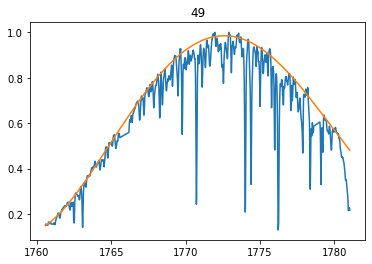

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

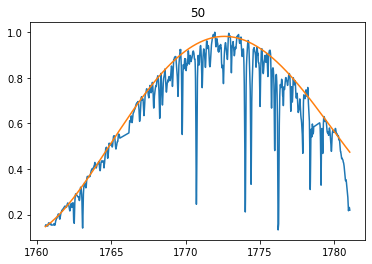

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

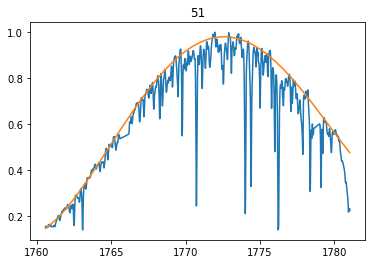

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

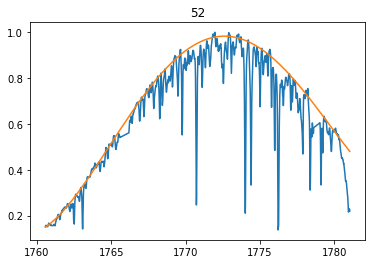

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

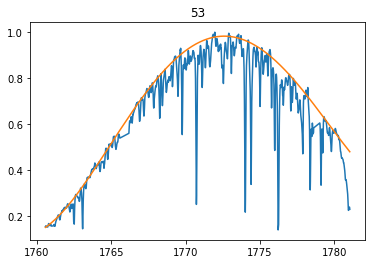

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

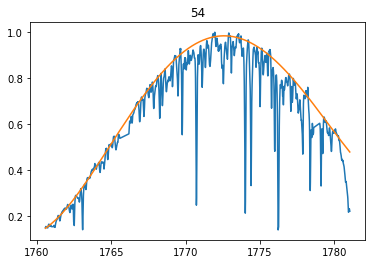

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

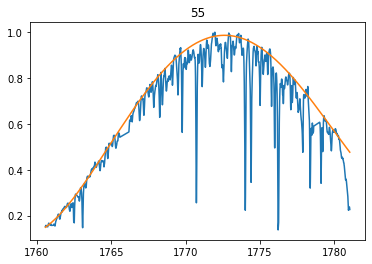

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

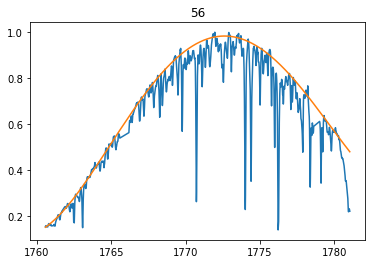

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

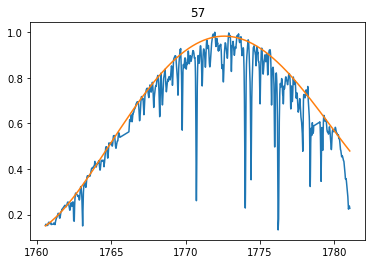

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

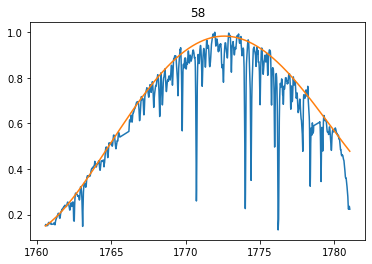

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

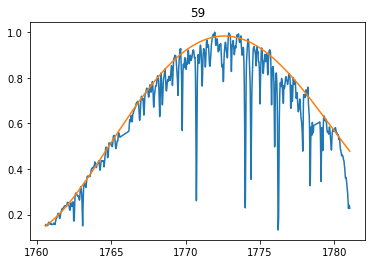

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

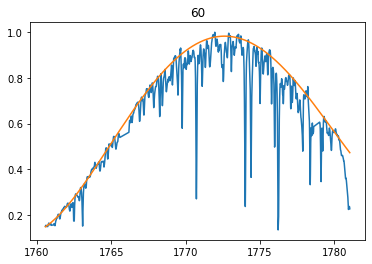

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

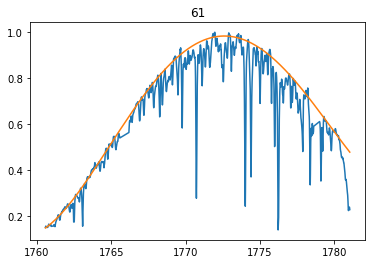

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

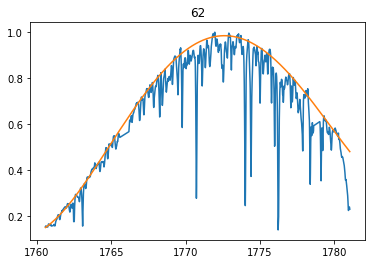

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

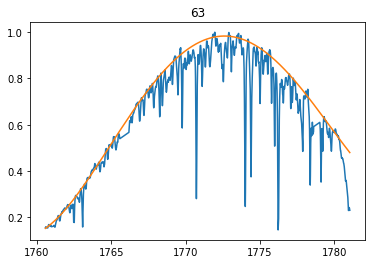

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

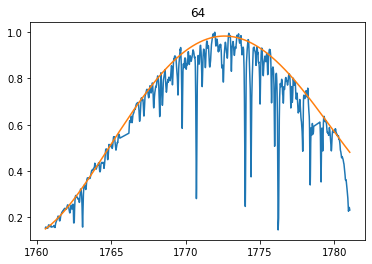

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

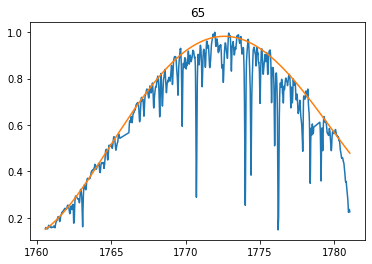

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

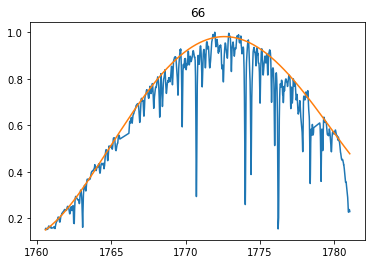

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

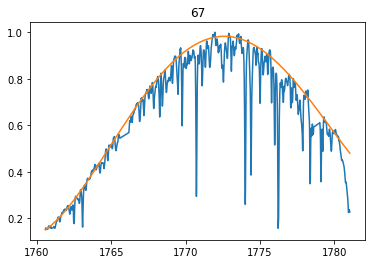

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

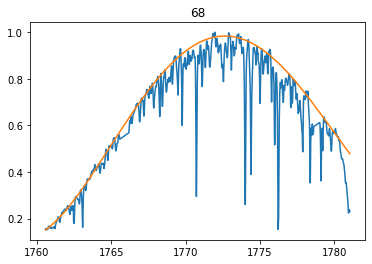

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

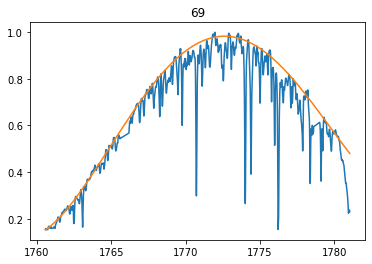

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

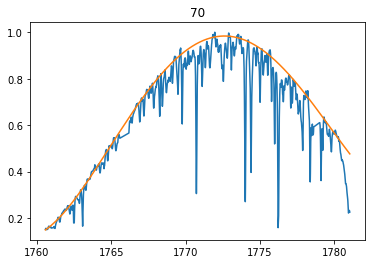

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

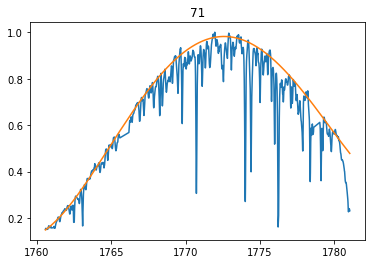

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

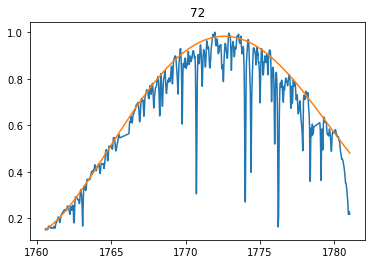

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

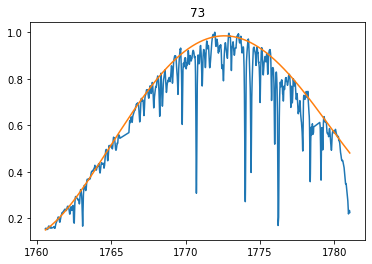

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

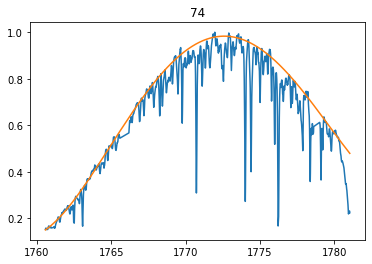

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

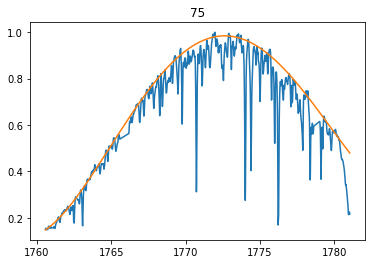

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

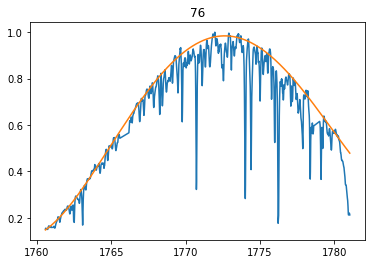

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

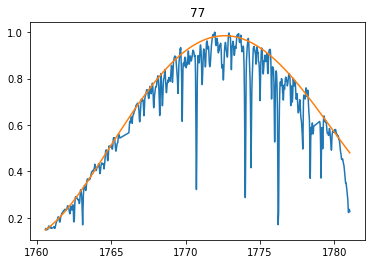

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

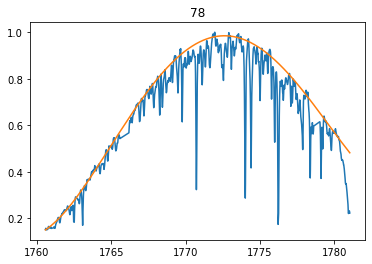

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

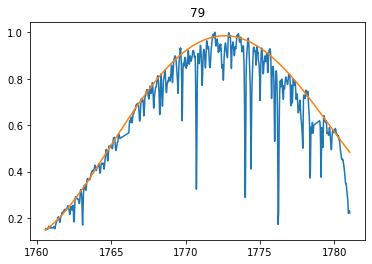

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

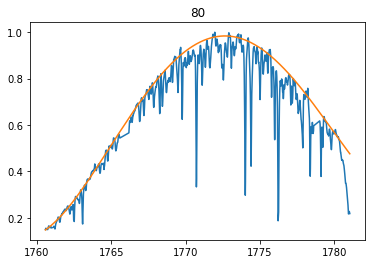

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

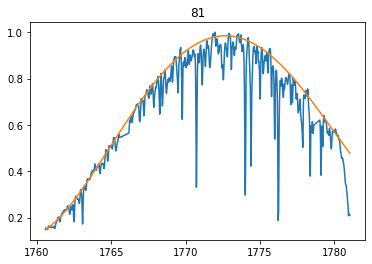

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

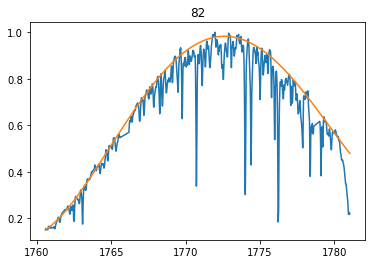

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

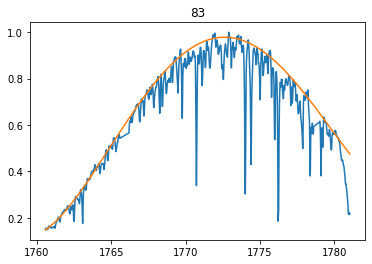

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

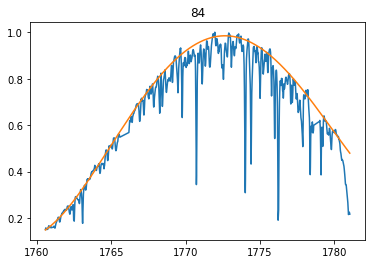

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

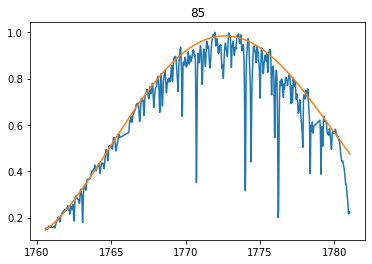

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

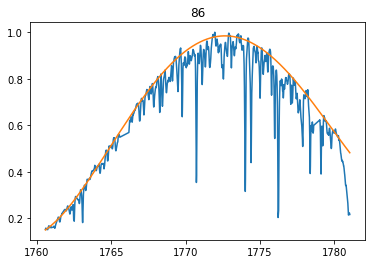

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

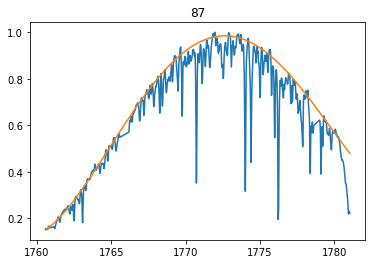

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

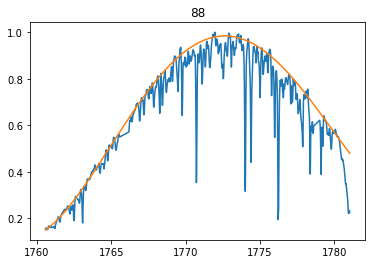

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

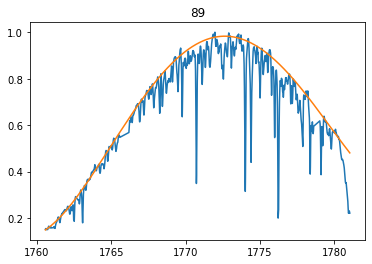

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

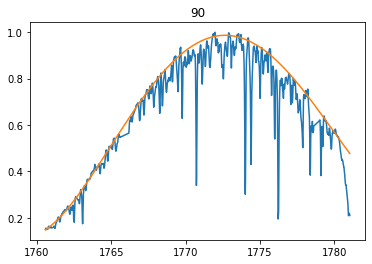

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

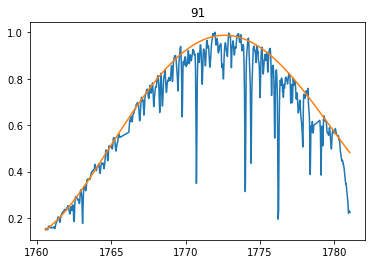

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

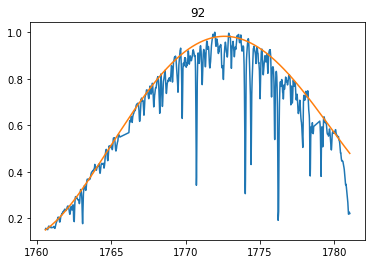

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

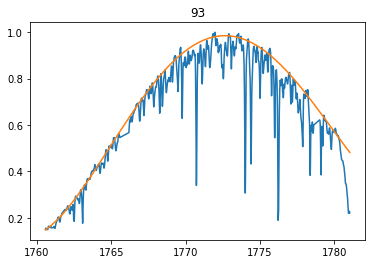

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

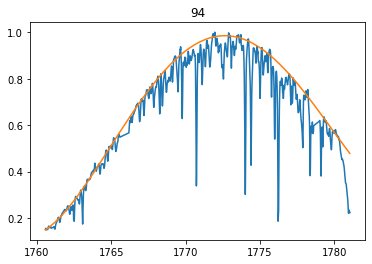

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

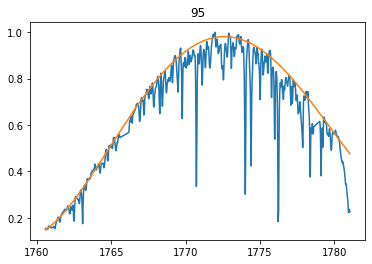

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

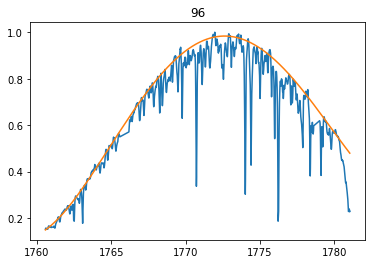

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

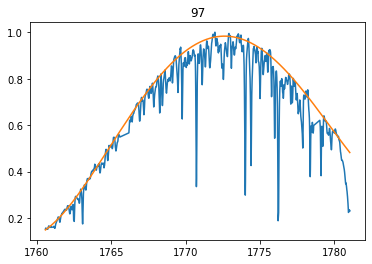

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

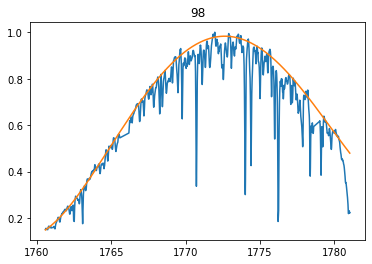

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

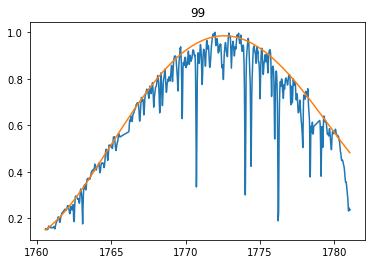

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

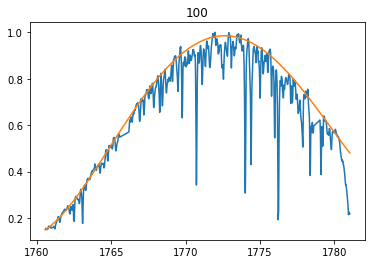

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

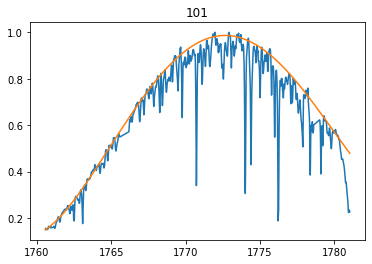

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

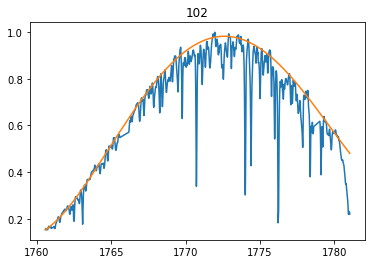

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

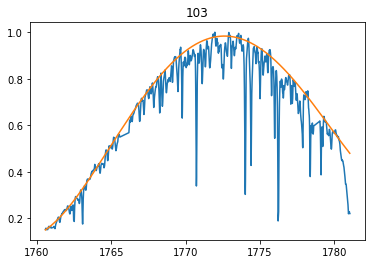

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

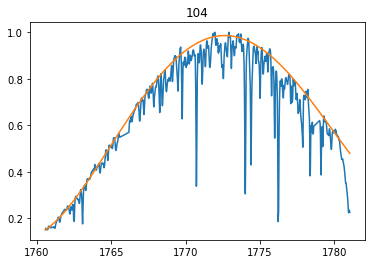

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

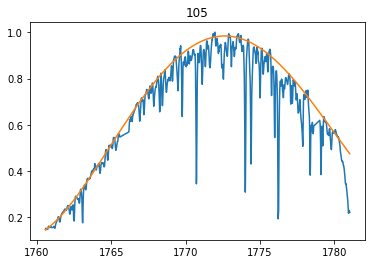

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

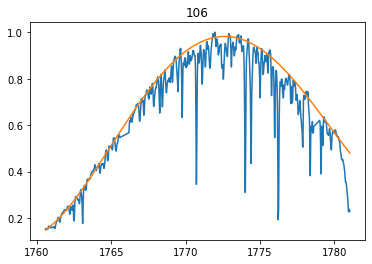

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

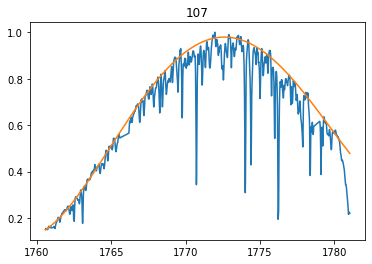

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

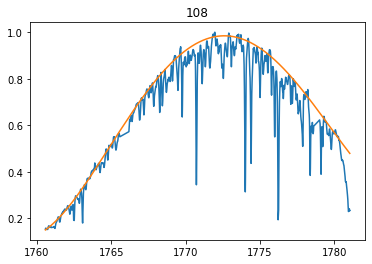

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

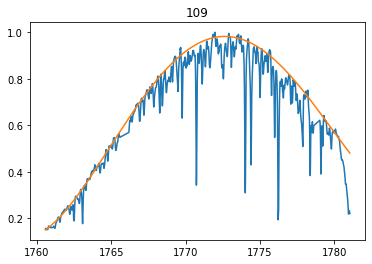

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

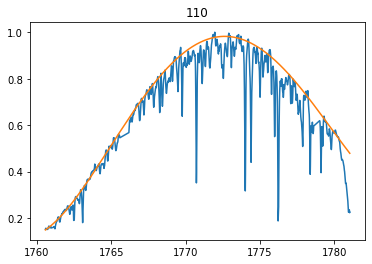

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

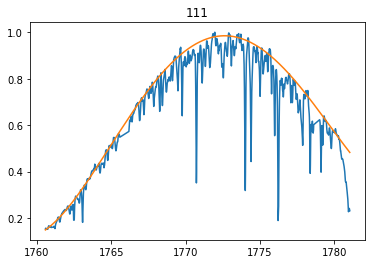

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

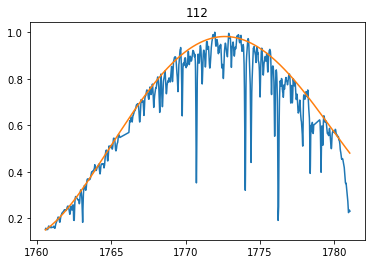

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

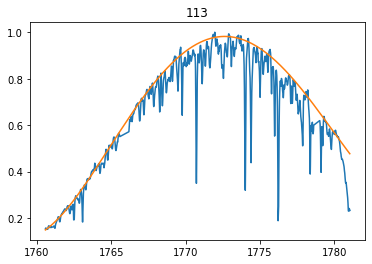

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

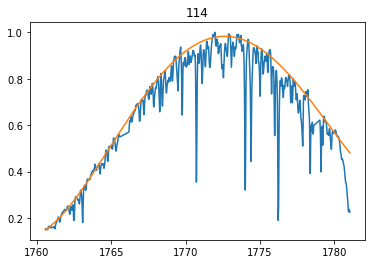

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

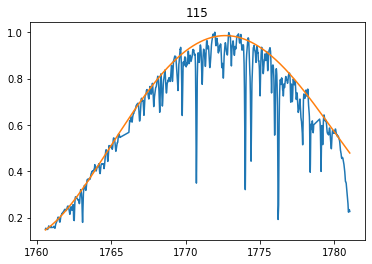

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

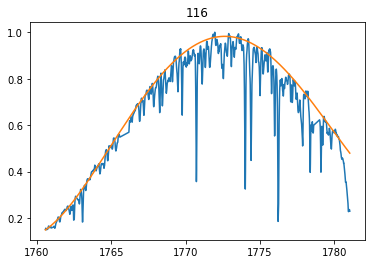

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

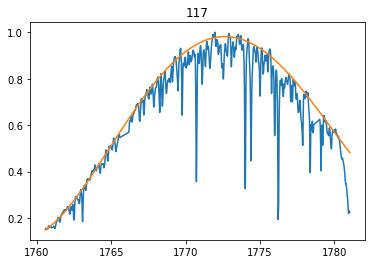

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

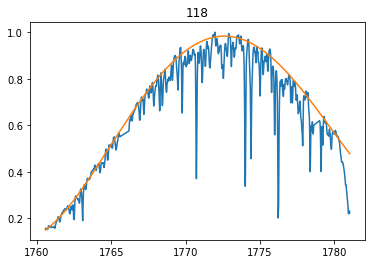

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

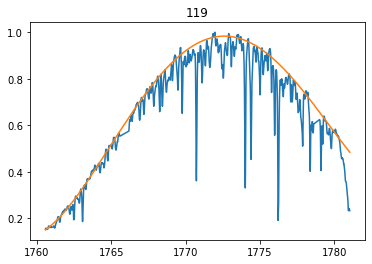

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

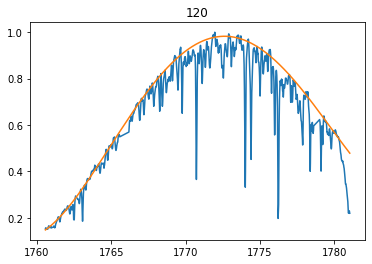

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

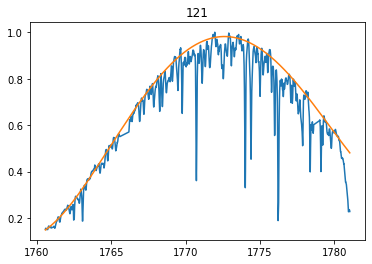

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

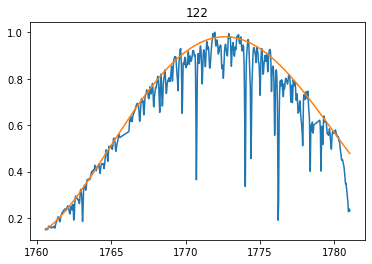

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

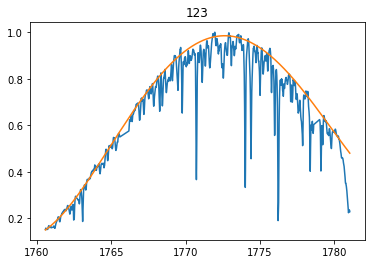

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RankWarning: Polyfit may be poorly conditioned
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: Ran

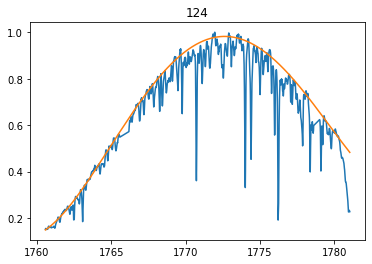

In [116]:
# try fitting blaze without these low flux regions
blaze = []
maxrms = 0.005
# fit blaze for each epoch
for iep in range(nep):
    test_flux = Ir[iep]
    test_wlens = np.copy(WW)
    #plt.plot(test_wlens,test_flux/np.max(test_flux))

    mask = np.ones(len(test_flux),'bool')
    normspec = test_flux/np.max(test_flux)
    curcall = 0
    residrms = 1
    numcall = 30
    while ((curcall < numcall) and (residrms > maxrms)):
        #print('On iteration {} of {}'.format(curcall,numcall))
        z,mask,residrms,test_wlens,normspec = blazeFit(test_wlens, normspec, maxrms,
                         numcalls=50, curcall=curcall,verbose=False,showplot=False)
        #mask = ~a
        curcall +=1
    wl = WW
    cfit = np.poly1d(z)
    plt.plot(wl,test_flux/np.max(test_flux))
    plt.plot(wl,cfit(wl))
    plt.title(iep)
    plt.show()
    blaze.append(cfit(wl))

In [117]:
Ir_blaze = Ir/blaze

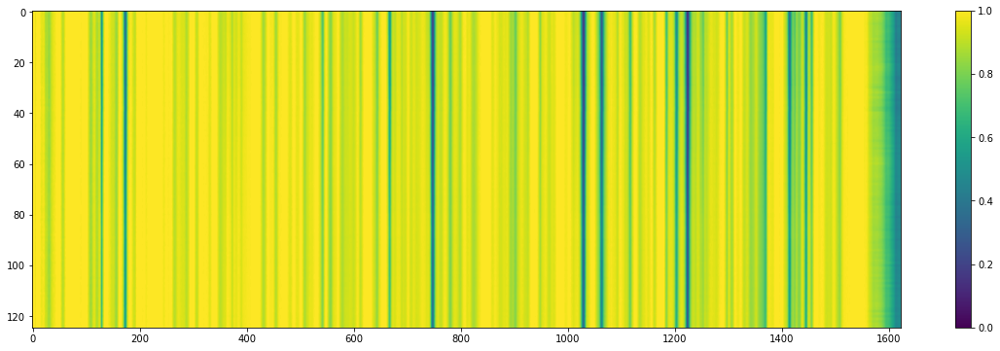

In [118]:
plt.figure(figsize=(20,6))
plt.imshow(Ir_blaze,aspect='auto',vmin=0,vmax=1)
plt.colorbar()

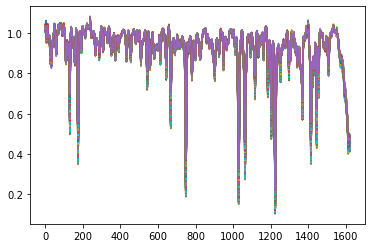

In [89]:
for iep in range(nep):
    plt.plot(Ir_blaze[iep])

In [119]:
n_ini,n_end = get_transit_dates(window)
c0 = Constants().c0
V_corr = vstar-berv
### First compute reference spectrum in the Geocentric frame
I_med2  = np.median(np.concatenate((Ir_blaze[:n_ini],Ir_blaze[n_end:]),axis=0),axis=0)
I_sub2  = np.zeros(Ir_blaze.shape)

# for each epoch
for kk in range(len(Ir_blaze)):
    X          = np.array([np.ones(len(I_med2)),I_med2],dtype=float).T
    p,pe       = LS(X,Ir_blaze[kk])
    Ip         = np.dot(X,p)
    I_sub2[kk] = Ir_blaze[kk]/Ip
    
sig_g = 1.

### Now mean spectrum in the stellar rest frame
V_cl      = c0*(WW/O.W_mean-1.)
I_bary    = move_spec(V_cl,I_sub2,V_corr,sig_g)  ## Shift to stellar rest frame
I_med     = np.median(np.concatenate((I_bary[:n_ini],I_bary[n_end:]),axis=0),axis=0) ## Compute median out-of-transit
I_med_geo = move_spec(V_cl,np.array([I_med]),-1.*V_corr,sig_g)  ## Move back ref spectrum to Geocentric frame
I_sub1    = np.zeros(I_sub2.shape)

# a stretch/shift of the stellar ref spec to each spectrum (then remove)
for kk in range(len(Ir_blaze)):
    X          = np.array([np.ones(len(I_med_geo[kk])),I_med_geo[kk]],dtype=float).T
    p,pe       = LS(X,I_sub2[kk])
    Ip         = np.dot(X,p)
    I_sub1[kk] = I_sub2[kk]/Ip

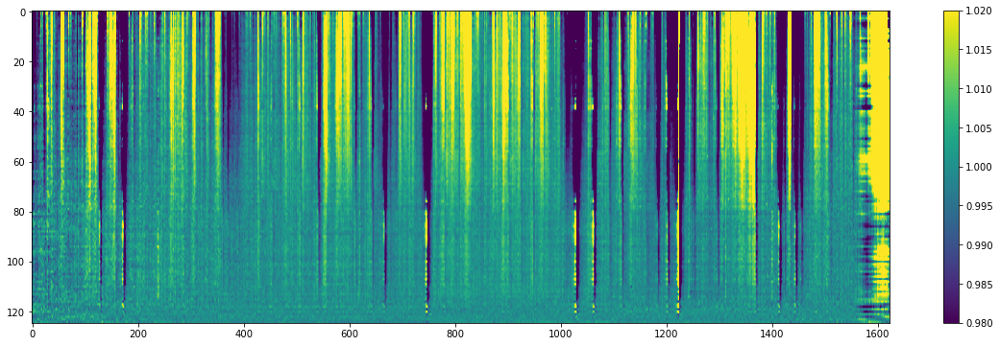

In [120]:
plt.figure(figsize=(20,6))
plt.imshow(I_sub1,aspect='auto',vmin=0.98,vmax=1.02)
plt.colorbar()

In [121]:
WW, Ir_blaze = O.filter_pixel(WW,I_sub1,deg_px=2,sig_px=5.)

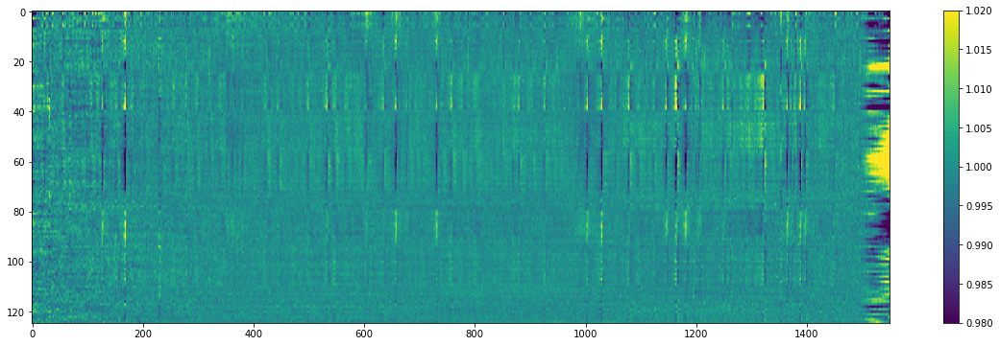

In [122]:
# detrend with airmass
I_log = np.log(Ir_blaze)
Il    = O.detrend_airmass(WW,I_log,airmass,2)
O.I_fin = np.exp(Il)
plt.figure(figsize=(20,6))
plt.imshow(O.I_fin,aspect='auto',vmin=0.98,vmax=1.02)
plt.colorbar()

### Residual sampling

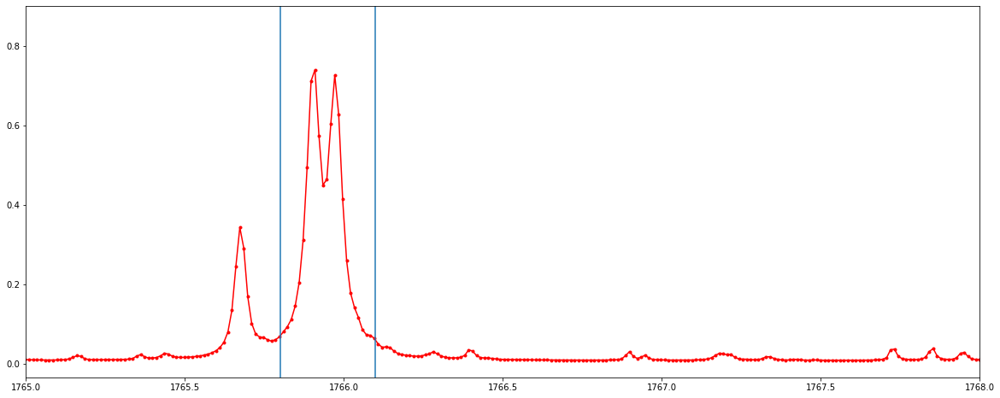

In [131]:
plt.figure(figsize=(20,8))
model = np.median(O.I_atm,axis=0)
plt.plot(O.W_atm[0],1-model,'r.-',label='skycalc model')
plt.xlim(1765,1768)
plt.axvline(1765.8)
plt.axvline(1766.1)

In [129]:
(O.W_atm[0].max()-O.W_atm[0].min())/len(O.W_atm[0])

0.012074582981483199

In [133]:
from scipy.signal import argrelextrema as argex

In [136]:
wmodel = O.W_atm[0]

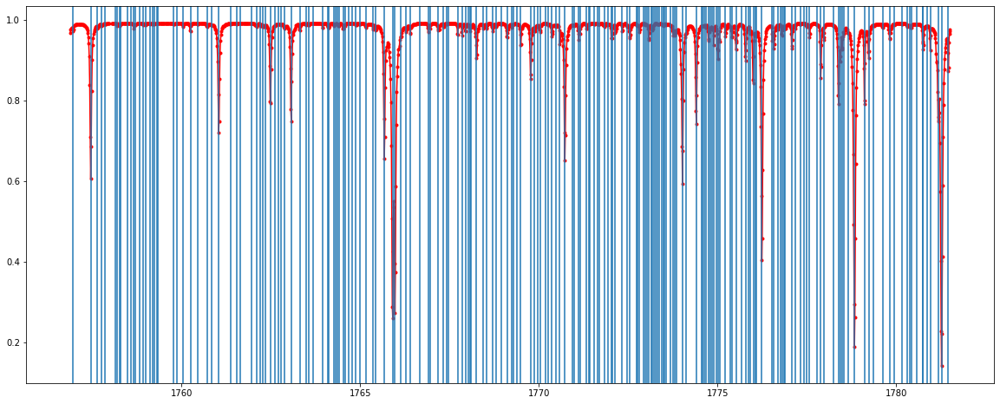

In [145]:
ind_ex = argex(model,np.less)[0]
plt.figure(figsize=(20,8))
plt.plot(wmodel,model,'r.-')
for i in ind_ex:
    plt.axvline(wmodel[i])

In [146]:
minima_idx = ind_ex[model[ind_ex]<0.7]

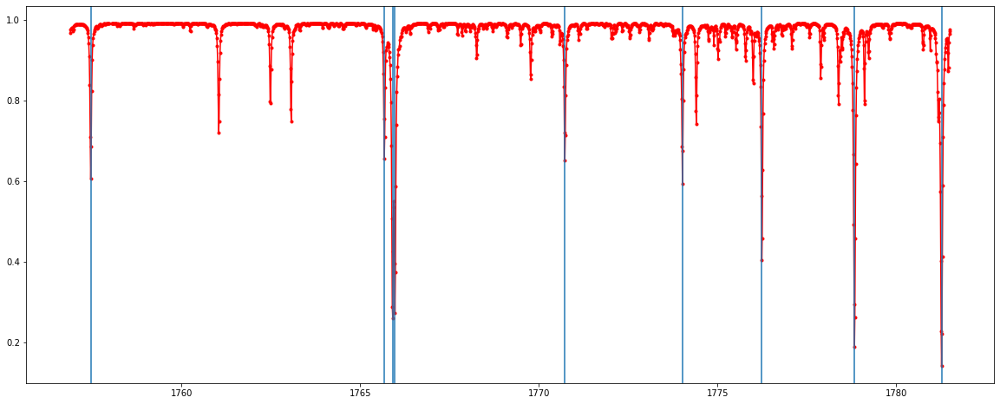

In [150]:
plt.figure(figsize=(20,8))
plt.plot(wmodel,model,'r.-')
for i in minima_idx:
    plt.axvline(wmodel[i])
#plt.xlim(1765,1768)

In [154]:
war = wmodel[minima_idx]

In [155]:
for i in war:
    print(i)

1757.4586697340396
1765.673089002065
1765.9095514832031
1765.9716819153703
1770.7249481834854
1774.015207160936
1776.23619434963
1778.828571566522
1781.2653468038166
